Dinosaur data 🦕

## 📖 Background
You're applying for a summer internship at a national museum for natural history. The museum recently created a database containing all dinosaur records of past field campaigns. Your job is to dive into the fossil records to find some interesting insights, and advise the museum on the quality of the data. 

## 💾 The data

### You have access to a real dataset containing dinosaur records from the Paleobiology Database ([source](https://paleobiodb.org/#/)):


| Column name | Description |
|---|---|
| occurence_no | The original occurrence number from the Paleobiology Database. |
| name | The accepted name of the dinosaur (usually the genus name, or the name of the footprint/egg fossil). |
| diet | The main diet (omnivorous, carnivorous, herbivorous). |
| type | The dinosaur type (small theropod, large theropod, sauropod, ornithopod, ceratopsian, armored dinosaur). |
| length_m | The maximum length, from head to tail, in meters. |
| max_ma | The age in which the first fossil records of the dinosaur where found, in million years. |
| min_ma | The age in which the last fossil records of the dinosaur where found, in million years. |
| region | The current region where the fossil record was found. |
| lng | The longitude where the fossil record was found. |
| lat | The latitude where the fossil record was found. |
| class | The taxonomical class of the dinosaur (Saurischia or Ornithischia). |
| family | The taxonomical family of the dinosaur (if known). |

The data was enriched with data from Wikipedia.

In [15]:
!pip3 install pandas
!pip3 install numpy
!pip3 install folium

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.0/100.0 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 7.3 MB/s eta 0:00:00


In [7]:
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt

dinosaurs = pd.read_csv('/Users/mac/Documents/GitHub/dinosaur-data/dinosaurs.csv')

In [8]:
dinosaurs

,occurrence_no,name,diet,type,length_m,max_ma,min_ma,region,lng,lat,class,family
0,130294,Protarchaeopteryx,omnivorous,small theropod,2.0,130.0,122.46,Liaoning,120.733330,41.799999,Saurischia,Archaeopterygidae
1,130295,Caudipteryx,omnivorous,small theropod,1.0,130.0,122.46,Liaoning,120.733330,41.799999,Saurischia,Caudipterygidae
2,139242,Gorgosaurus,carnivorous,large theropod,8.6,83.5,70.60,Alberta,-111.528732,50.740726,Saurischia,Tyrannosauridae
3,139250,Gorgosaurus,carnivorous,large theropod,8.6,83.5,70.60,Alberta,-111.549347,50.737015,Saurischia,Tyrannosauridae
4,139252,Gorgosaurus,carnivorous,large theropod,8.6,83.5,70.60,Alberta,-111.564636,50.723866,Saurischia,Tyrannosauridae
...,...,...,...,...,...,...,...,...,...,...,...,...
4946,1360627,Isaberrysaura,NaN,NaN,NaN,171.6,168.40,Neuquén,-70.263290,-39.205288,Ornithischia,NaN
4947,1363632,Stegosaurus,herbivorous,armored dinosaur,9.0,157.3,152.10,Wyoming,-107.816666,44.650002,Ornithischia,Stegosauridae
4948,1363633,Othnielosaurus,NaN,NaN,NaN,157.3,152.10,Wyoming,-107.816666,44.650002,Ornithischia,NaN
4949,1364695,Iguanodon,herbivorous,ornithopod,10.0,145.0,139.80,Niedersachsen,9.959357,52.341167,Ornithischia,NaN


## 💪 Challenge
Help your colleagues at the museum to gain insights on the fossil record data. Include:


1. How many different dinosaur names are present in the data?
2. Which was the largest dinosaur? What about missing data in the dataset?
3. What dinosaur type has the most occurrences in this dataset? Create a visualization (table, bar chart, or equivalent) to display the number of dinosaurs per type. Use the AI assistant to tweak your visualization (colors, labels, title...).
4. Did dinosaurs get bigger over time? Show the relation between the dinosaur length and their age to illustrate this.
5. Use the AI assitant to create an interactive map showing each record. 
6. Any other insights you found during your analysis?

In [9]:
#1. How many different dinosaur names are present in the data?
unique_dinosaur_names_count = dinosaurs["name"].nunique()
print(unique_dinosaur_names_count)

1042


In [10]:
#2. Which was the largest dinosaur? What about missing data in the dataset?
# Identify the row of the largest dinosaur
largest_dinosaur_row = dinosaurs.loc[dinosaurs["length_m"].idxmax()]

largest_dinosaur_name = largest_dinosaur_row["name"]

print(largest_dinosaur_name)

Supersaurus


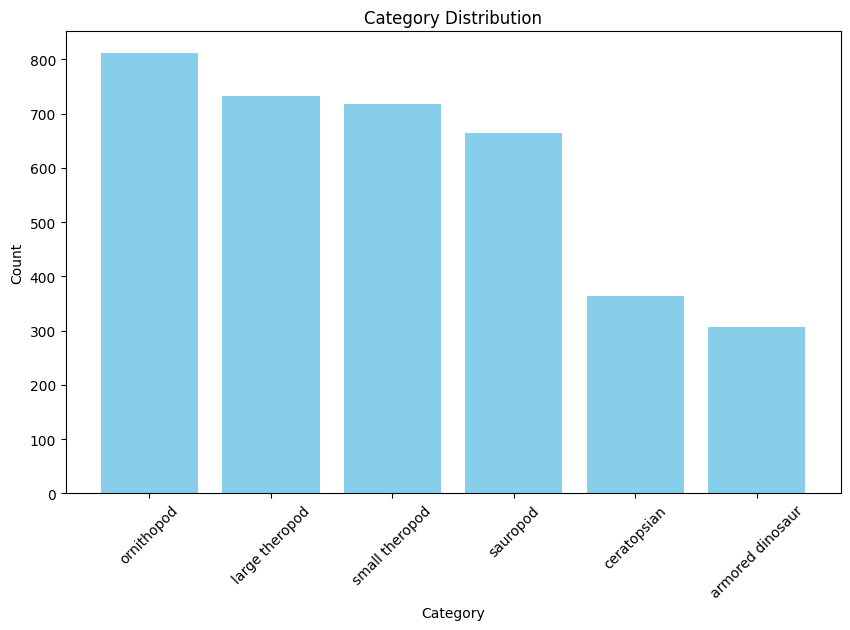

In [11]:
#3. What dinosaur type has the most occurrences in this dataset? Create a visualization (table, bar chart, or equivalent) to display the number of dinosaurs per type. Use the AI assistant to tweak your visualization (colors, labels, title...).

category_counts = dinosaurs['type'].value_counts()

plt.figure(figsize=(10, 6))
plt.bar(category_counts.index, category_counts.values, color='skyblue')
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Category Distribution')
plt.xticks(rotation=45)

plt.show()


In [18]:
dinosaurs['average_ma'] = (dinosaurs['max_ma'] + dinosaurs['min_ma']) / 2

dinosaurs.head

<bound method NDFrame.head of       occurrence_no               name         diet              type  \
0            130294  Protarchaeopteryx   omnivorous    small theropod   
1            130295        Caudipteryx   omnivorous    small theropod   
2            139242        Gorgosaurus  carnivorous    large theropod   
3            139250        Gorgosaurus  carnivorous    large theropod   
4            139252        Gorgosaurus  carnivorous    large theropod   
...             ...                ...          ...               ...   
4946        1360627      Isaberrysaura          NaN               NaN   
4947        1363632        Stegosaurus  herbivorous  armored dinosaur   
4948        1363633     Othnielosaurus          NaN               NaN   
4949        1364695          Iguanodon  herbivorous        ornithopod   
4950        1365108         Luluichnus          NaN               NaN   

      length_m  max_ma  min_ma             region         lng        lat  \
0          2.0   

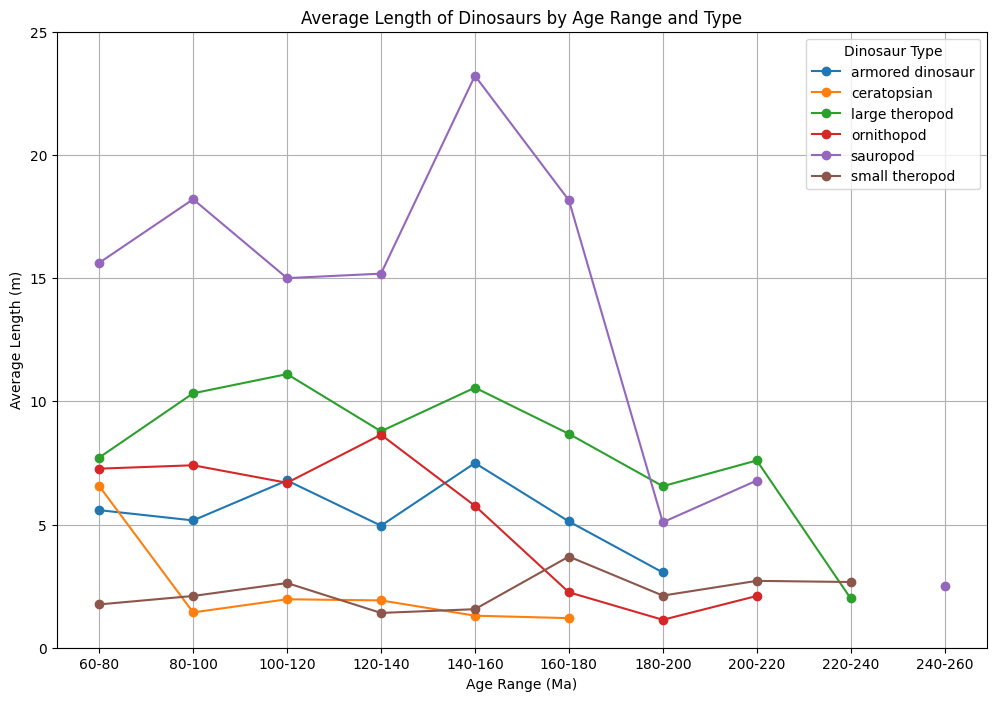

In [13]:
#4. Did dinosaurs get bigger over time? Show the relation between the dinosaur length and their age to illustrate this.
def categorize_age(age):
    return (age // 20) * 20

dinosaurs['age_range'] = dinosaurs['average_ma'].apply(categorize_age)

average_length_by_age_range_type = dinosaurs.groupby(['age_range', 'type'])['length_m'].mean().unstack()

plt.figure(figsize=(12, 8))
average_length_by_age_range_type.plot(kind='line', marker='o', ax=plt.gca())
plt.xlabel("Age Range (Ma)")
plt.ylabel("Average Length (m)")
plt.title("Average Length of Dinosaurs by Age Range and Type")

plt.ylim(0, 25)
plt.yticks(range(0, 26, 5))
plt.xticks(range(60, 259, 20), labels=[f'{i}-{i+20}' for i in range(60, 259, 20)])

plt.legend(title="Dinosaur Type")
plt.grid(True)
plt.show()


As you can find from overall dinosaurs' length average, 4 out of 5 types of dinosaur types shows the deline of the length. It implies that dinosaurs get smaller over time. It shows the shows the negative relation between the dinosaur length and their age. <br>

In [16]:
# 5. Use the AI assitant to create an interactive map showing each record. 
from folium.plugins import MarkerCluster

m = folium.Map(location=[20, 0], zoom_start=2)

marker_cluster = MarkerCluster().add_to(m)

for idx, row in dinosaurs.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup=f"Name: {row['name']}<br>Type: {row['type']}<br>Diet: {row['diet']}<br>Length: {row['length_m']} m<br>Age: {row['average_ma']} Ma",
    ).add_to(marker_cluster)

m

In [19]:
# 6. Any other insights you found during your analysis?
# - Data Cleaning
print(dinosaurs.isnull().sum()) 

occurrence_no       0
name                0
diet             1355
type             1355
length_m         1383
max_ma              0
min_ma              0
region             42
lng                 0
lat                 0
class               0
family           1457
average_ma          0
age_range           0
dtype: int64


diet
carnivorous     5.598141
herbivorous    10.294680
omnivorous      4.208962
Name: length_m, dtype: float64


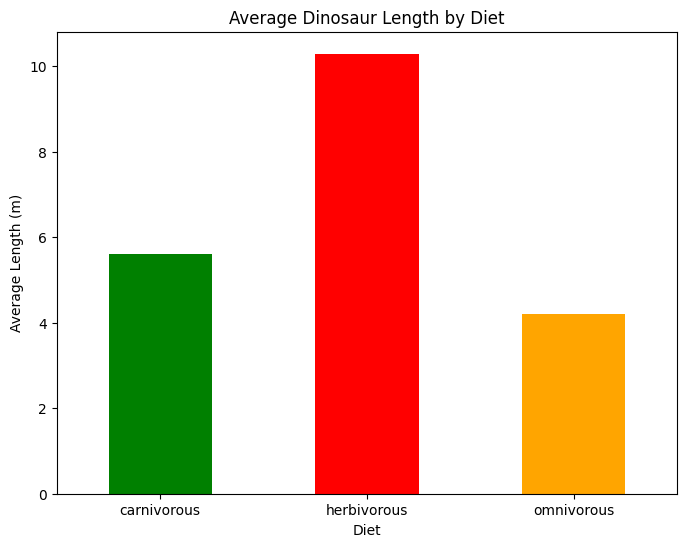

In [29]:
# - Diet Analysis
average_length_by_diet = dinosaurs.groupby('diet')['length_m'].mean()
print(average_length_by_diet)


plt.figure(figsize=(8, 6))
average_length_by_diet.plot(kind='bar', color=['green', 'red', 'orange']) 
plt.xlabel("Diet")
plt.ylabel("Average Length (m)")
plt.title("Average Dinosaur Length by Diet")
plt.xticks(rotation=0)
plt.show()

diet              carnivorous  herbivorous  omnivorous
type                                                  
armored dinosaur     0.000000   100.000000    0.000000
ceratopsian          0.000000   100.000000    0.000000
large theropod      89.904502     0.409277    9.686221
ornithopod           0.000000   100.000000    0.000000
sauropod             0.000000    88.571429   11.428571
small theropod      90.516039     0.418410    9.065551


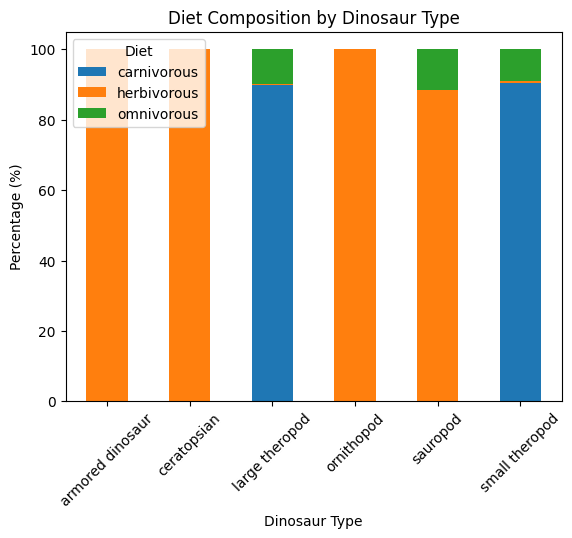

In [27]:
diet_composition_by_type = dinosaurs.groupby('type')['diet'].value_counts().unstack(fill_value=0)
diet_composition_by_type_percentages = diet_composition_by_type.div(diet_composition_by_type.sum(axis=1), axis=0) * 100
print(diet_composition_by_type_percentages)


diet_composition_by_type_percentages.plot(kind='bar', stacked=True)
plt.xlabel("Dinosaur Type")
plt.ylabel("Percentage (%)")
plt.title("Diet Composition by Dinosaur Type")
plt.legend(title="Diet")
plt.xticks(rotation=45)
plt.show()

In [26]:
def get_marker_color(dinosaur_type):
  color_map = {
      "small theropod": "blue",
      "large theropod": "red",
      "sauropod": "green",
      "ornithopod": "purple",
      "ceratopsian": "orange",
      "armored dinosaur": "brown"
  }
  return color_map.get(dinosaur_type, "gray") 
m = folium.Map(location=[20, 0], zoom_start=2)

for idx, row in dinosaurs.iterrows():
  folium.Marker(
      location=[row['lat'], row['lng']],
      popup=f"Name: {row['name']}<br>Type: {row['type']}<br>Diet: {row['diet']}<br>Length: {row['length_m']} m<br>Age: {row['average_ma']} Ma",
      icon=folium.Icon(color=get_marker_color(row["type"]))

m


/var/folders/9y/vq94wzb56zs3_sskfpcsdh840000gn/T/ipykernel_29553/1241456670.py:26: UserWarning: color argument of Icon should be one of: {'white', 'cadetblue', 'red', 'beige', 'lightred', 'gray', 'purple', 'lightgreen', 'black', 'orange', 'pink', 'darkred', 'blue', 'darkpurple', 'lightgray', 'green', 'lightblue', 'darkgreen', 'darkblue'}.
  icon=folium.Icon(color=get_marker_color(row["type"]))  # Set marker color based on type
